In [1]:
import pandas as pd
import numpy as np
import scipy
import yfinance as yf
import matplotlib.pyplot as plt
from scipy.optimize import minimize
import re
import sys


#### 거래량 기준으로 IQR 적용해서 하한선 만든 다음 MAD Z-score 적용해서 전처리 한 데이터 (data_call, data_put)

In [2]:
data_call = pd.read_csv('data_call.csv')
data_put = pd.read_csv('data_put.csv')

In [3]:
pd.set_option('display.max_columns', None)

In [4]:
data_call

,Unnamed: 0,underlying_symbol,quote_datetime,root,expiration,strike,option_type,open,high,low,close,trade_volume,bid_size,bid,ask_size,ask,underlying_bid,underlying_ask,implied_underlying_price,active_underlying_price,implied_volatility,delta,gamma,theta,vega,rho,log_strike
0,0,^SPX,2024-08-05 10:18:00,SPXW,2024-08-05,2200.0,C,2990.00,2990.00,2990.00,2990.00,3,15,2983.7,15,2997.5,5186.66,5192.55,0.0,5189.605,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-0.858200
1,1,^SPX,2024-08-05 09:43:00,SPXW,2024-08-05,4300.0,C,853.38,853.38,853.38,853.38,2,5,848.7,6,856.3,5143.03,5154.71,0.0,5148.870,3.7412,0.9679,0.0001,-6.6129,0.0994,0.0357,-0.180162
2,2,^SPX,2024-08-05 09:44:00,SPXW,2024-08-05,4300.0,C,859.86,859.86,859.86,859.86,3,6,852.6,5,860.2,5145.67,5156.50,0.0,5151.085,3.7454,0.9678,0.0001,-6.6332,0.0996,0.0359,-0.180592
3,3,^SPX,2024-08-05 09:45:00,SPXW,2024-08-05,4400.0,C,751.18,751.18,751.18,751.18,2,1,751.8,5,764.9,5148.28,5159.04,0.0,5153.660,2.9431,0.9798,0.0001,-3.0234,0.0673,0.0361,-0.158103
4,4,^SPX,2024-08-05 09:46:00,SPXW,2024-08-05,4400.0,C,764.79,764.79,764.79,764.79,3,5,771.3,5,778.4,5165.48,5176.19,0.0,5170.835,3.1269,0.9761,0.0001,-3.9030,0.0777,0.0331,-0.161430
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48106,48106,^SPX,2024-08-05 15:53:00,SPX,2026-12-18,7800.0,C,20.50,20.50,20.50,20.50,3,75,11.3,75,32.0,5172.25,5174.39,0.0,5173.320,0.1320,0.0559,0.0001,-0.0614,9.4495,6.1429,0.410609
48107,48107,^SPX,2024-08-05 15:54:00,SPX,2026-12-18,7800.0,C,20.40,20.40,20.30,20.30,2,75,11.2,75,32.0,5172.73,5174.91,0.0,5173.820,0.1320,0.0558,0.0001,-0.0613,9.4322,6.1301,0.410512
48108,48108,^SPX,2024-08-05 15:55:00,SPX,2026-12-18,7800.0,C,20.20,20.20,19.90,19.90,4,75,11.2,75,32.0,5171.03,5173.37,0.0,5172.200,0.1320,0.0558,0.0001,-0.0613,9.4341,6.1309,0.410826
48109,48109,^SPX,2024-08-05 09:43:00,SPX,2026-12-18,8600.0,C,26.66,26.66,26.66,26.66,1,0,0.0,57,29.9,5143.03,5154.71,0.0,5148.870,0.1527,0.0363,0.0001,-0.0500,6.6894,3.9319,0.512985


#### 파라미터 최적화하기 전 Vol Smile 시각화

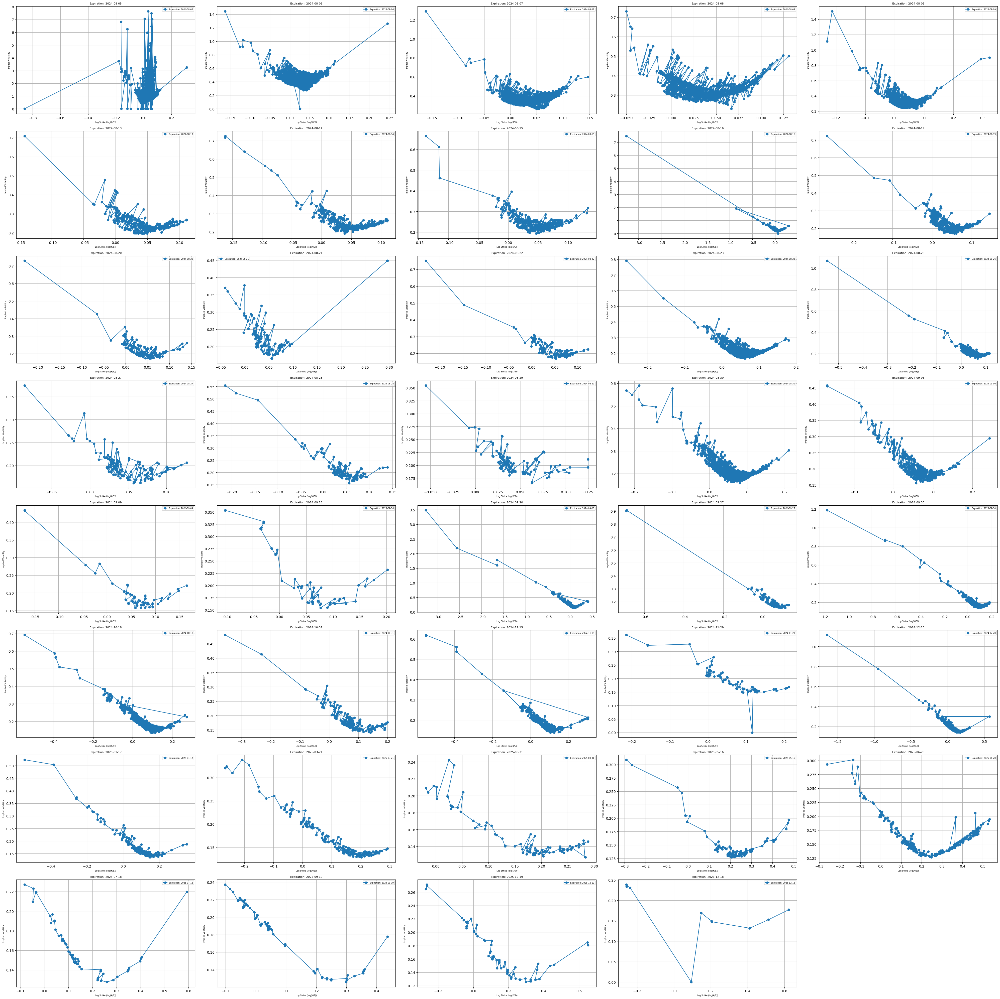

In [5]:
'''
Call
'''


# 만기일을 기준으로 그룹화
grouped =data_call.groupby('expiration')

# 총 그래프 개수 설정
n_groups = len(grouped)
ncols = 5
nrows = (n_groups // ncols) + (n_groups % ncols > 0)

# 플롯 크기 설정
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 40))
axes = axes.flatten()  # 그래프를 1D 배열로 변환

# 각 그룹별로 개별 그래프 생성
for i, (name, group) in enumerate(grouped):
    ax = axes[i]
    ax.plot(group['log_strike'], group['implied_volatility'], marker='o', linestyle='-', label=f'Expiration: {name}')
    ax.set_title(f'Expiration: {name}', fontsize=8)
    ax.set_xlabel('Log Strike (log(K/S))', fontsize=6)
    ax.set_ylabel('Implied Volatility', fontsize=6)
    ax.grid(True)
    ax.legend(fontsize=6)

# 남는 플롯은 빈 화면으로 설정
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


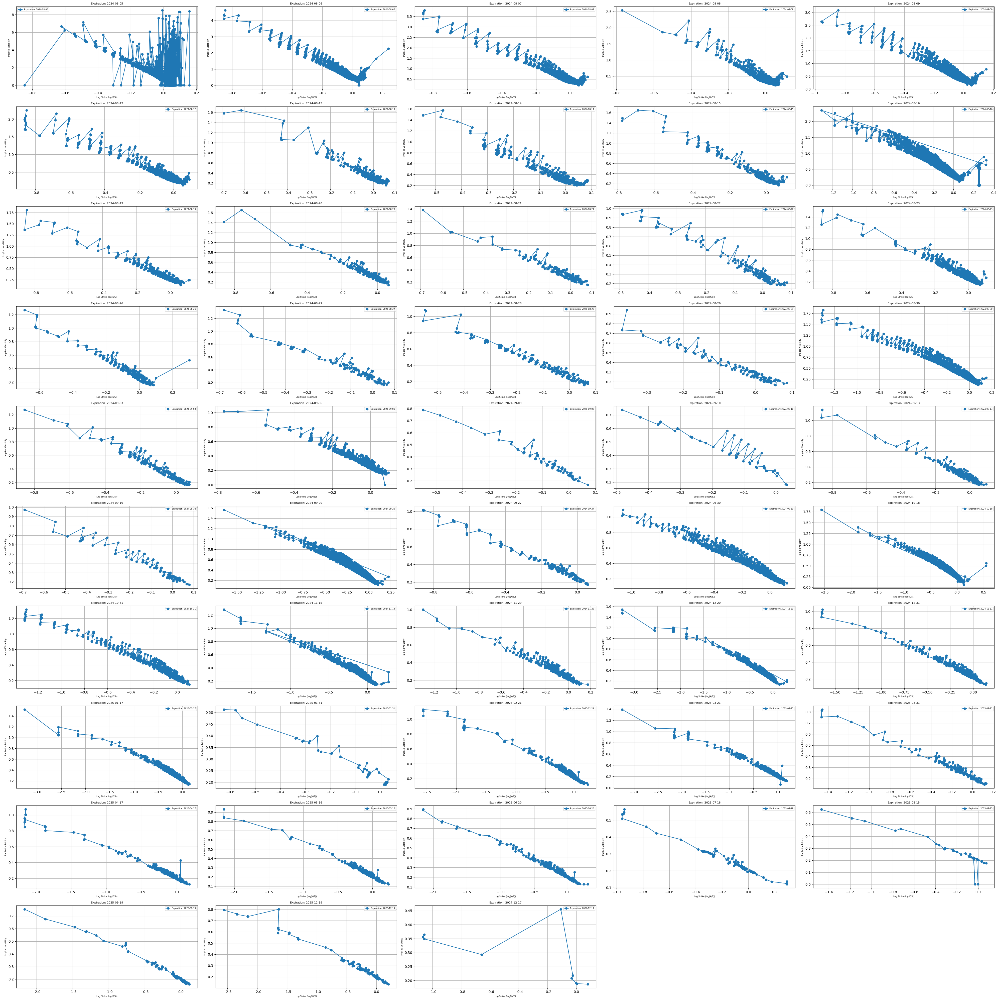

In [6]:
'''
Put
'''

# 만기일을 기준으로 그룹화
grouped =data_put.groupby('expiration')

# 총 그래프 개수 설정
n_groups = len(grouped)
ncols = 5
nrows = (n_groups // ncols) + (n_groups % ncols > 0)

# 플롯 크기 설정
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 40))
axes = axes.flatten()  # 그래프를 1D 배열로 변환

# 각 그룹별로 개별 그래프 생성
for i, (name, group) in enumerate(grouped):
    ax = axes[i]
    ax.plot(group['log_strike'], group['implied_volatility'], marker='o', linestyle='-', label=f'Expiration: {name}')
    ax.set_title(f'Expiration: {name}', fontsize=8)
    ax.set_xlabel('Log Strike (log(K/S))', fontsize=6)
    ax.set_ylabel('Implied Volatility', fontsize=6)
    ax.grid(True)
    ax.legend(fontsize=6)

# 남는 플롯은 빈 화면으로 설정
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


## SVI Model에서의 NLP 최적화: Call Options
### w(k) = a + b  (ρ  (k - m) + √((k - m)² + σ²))

In [7]:
def svi_model(k, a, b, rho, m, sigma):
    """
    SVI 모델: 로그 행사가격에 따른 내재 변동성을 설명하는 함수
    """
    return a + b * (rho * (k - m) + np.sqrt((k - m)**2 + sigma**2))


최적화의 목표: 시장에서 추정된 총 변동성(w_pred)와 SVI 모델의 총 변동성(w_actual) 사이의 오차 최소화

 => min{sum((w_pred - w_actual))**2}

In [8]:
# Step 1: 목적 함수 정의
def objective_function(params, k, w_actual):
    a, b, rho, m, sigma = params
    # SVI 모델을 통해 예측된 총 변동성 계산
    w_pred = svi_model(k, a, b, rho, m, sigma)
    # 실제 변동성과 모델 변동성의 차이를 최소화하는 목적 함수
    return np.sum((w_pred - w_actual) ** 2)

# Step 2: 제약식 설정
# 경계 조건 설정 (b > 0, sigma > 0)
bounds = [(None, None), (0, None), (-1, 1), (None, None), (0, None)]  # [a, b, rho, m, sigma]

# 비선형 제약 조건 설정 (|rho| < 1)
def rho_constraint(params):
    _, _, rho, _, _ = params
    return 1 - abs(rho)

constraints = [{'type': 'ineq', 'fun': rho_constraint}]

In [9]:
# Step 3: 초기 파라미터 추정값 설정 (기존 논문에서 자주 사용되는 초기값 차용)
initial_params = [-0.041, 0.1331, 0.306, 0.3586, 0.4153]  # [a, b, rho, m, sigma]

# 실제 총 변동성 계산(implied volatility의 제곱)
data_call['w_actual'] = data_call['implied_volatility'] ** 2

### sol 1) L-BFGS-B 최적화

In [10]:
# Step 4: 각 만기일별로 SVI 파라미터 최적화 진행
expiration_dates = data_call['expiration'].unique()  # 만기일 목록

svi_params = {}
for expiration in expiration_dates:
    # 해당 만기일의 데이터 서브셋 선택
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values  # 로그 행사가격
    w_actual = subset['w_actual'].values  # 실제 총 변동성
    
    # Step 5: scipy의 minimize 함수를 사용하여 최적화 수행
    result = minimize(objective_function, initial_params, args=(k, w_actual),
                      method='L-BFGS-B', bounds=bounds, constraints=constraints)
    
    # 최적화된 파라미터 저장
    svi_params[expiration] = result.x

/Users/justhaji/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minimize.py:565: RuntimeWarning: Method L-BFGS-B cannot handle constraints.
  warn('Method %s cannot handle constraints.' % method,


### SVI 1st fitting

/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/998176861.py:19: RuntimeWarning: invalid value encountered in sqrt
  plt.plot(k, np.sqrt(svi_model(k, *params)), label='SVI Model Fit', color='red')


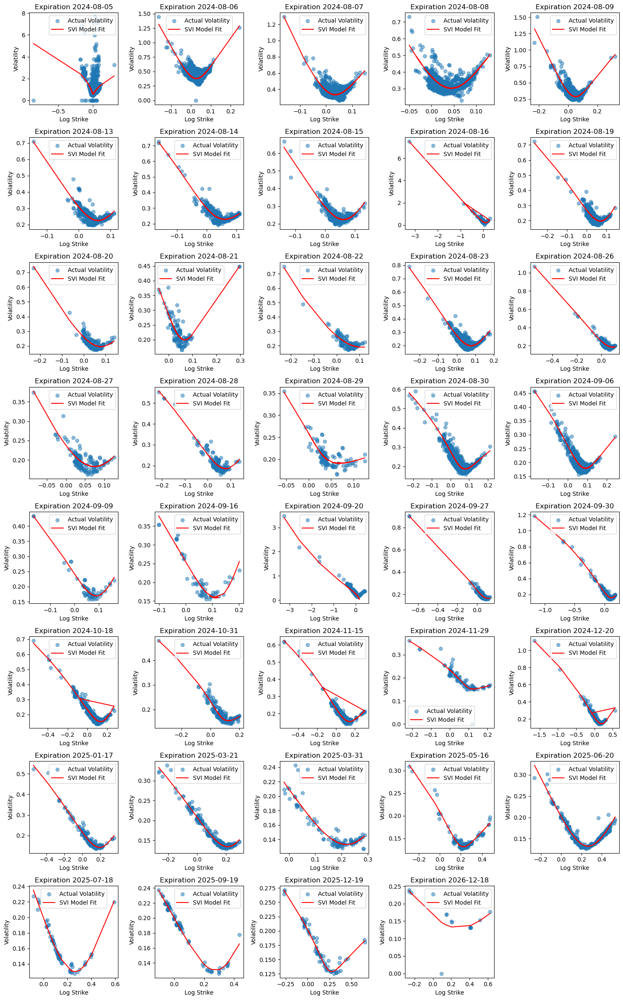

In [11]:
# Step 6: 변동성 스마일 시각화
num_expirations = len(expiration_dates)  # 만기일 수
cols = 5  # 한 행에 표시할 그래프 수
rows = (num_expirations // cols) + (num_expirations % cols > 0)  # 필요한 행 수 계산

plt.figure(figsize=(15, rows * 3))  # 전체 그림 크기 설정

for i, expiration in enumerate(expiration_dates, 1):
    # 해당 만기일 데이터 서브셋 선택
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values  # 로그 행사가격
    w_actual = subset['w_actual'].values  # 실제 총 변동성
    
    # 최적화된 파라미터 가져오기
    params = svi_params[expiration]
    
    plt.subplot(rows, cols, i)
    plt.scatter(k, np.sqrt(w_actual), label='Actual Volatility', alpha=0.5)
    plt.plot(k, np.sqrt(svi_model(k, *params)), label='SVI Model Fit', color='red')
    plt.xlabel('Log Strike')
    plt.ylabel('Volatility')
    plt.title(f'Expiration {expiration}')
    plt.legend()

plt.tight_layout()
plt.show()


- 파란색 점 (Actual Volatility): 각 만기일별 옵션 데이터에서 log_strike에 대한 실제 내재 변동성(실제 시장 변동성)을 의미함. 각 점은 해당 만기일에 거래된 옵션의 log_strike와 implied_volatility 값에 대응하고, 실제 시장에서 관측된 변동성 데이터를 시각화한 것

- 빨간색 선 (SVI Model Fit): SVI 모델을 사용해 추정된 변동성 스마일. 모델에서 계산된 변동성 곡선이며, 각 만기일에 대해 SVI 파라미터(a, b, ρ, m, σ)를 최적화하여 시장 변동성 곡선을 가장 잘 나타내도록 피팅한 결과이다. 빨간색 선은 SVI 모델을 사용해 변동성 곡선을 매끄럽게 만들며, convexity를 만족하는 형태로 변동성 스마일을 표현한다

결과 저장하자

In [12]:
# 각 만기일별로 최적화된 파라미터 출력
for expiration, params in svi_params.items():
    print(f"Expiration: {expiration}")
    print(f"Optimized Parameters: {params}\n")

# 만기일별 최적화된 파라미터를 DataFrame으로 저장
result_data_1st_fitting = pd.DataFrame.from_dict(svi_params, orient='index', columns=['a', 'b', 'rho', 'm', 'sigma'])
result_data_1st_fitting

Expiration: 2024-08-05
Optimized Parameters: [ 1.48221115e-01  2.35779027e+01 -3.27093470e-01  2.29902304e-03
  9.10460471e-03]

Expiration: 2024-08-06
Optimized Parameters: [-5.57609298 23.33782512 -0.23359185 -0.03336359  0.25193668]

Expiration: 2024-08-07
Optimized Parameters: [-8.55691809 48.79117411 -0.74560612 -0.26294467  0.26657459]

Expiration: 2024-08-08
Optimized Parameters: [-17.96560727  39.66277947  -0.51874578  -0.27898308   0.53250891]

Expiration: 2024-08-09
Optimized Parameters: [-2.50296592 11.70936872 -0.45621733 -0.07569296  0.24809987]

Expiration: 2024-08-13
Optimized Parameters: [-1.11244079  5.31584199 -0.10036482  0.03891296  0.21983145]

Expiration: 2024-08-14
Optimized Parameters: [-0.28388116  2.89625269 -0.41473064  0.00343951  0.12742312]

Expiration: 2024-08-15
Optimized Parameters: [-4.45602426 10.45614834  0.29259944  0.20055564  0.45067928]

Expiration: 2024-08-16
Optimized Parameters: [-57.72085759  27.86467653  -0.50765177  -1.31202842   2.40624892

,a,b,rho,m,sigma
2024-08-05,0.148221,23.577903,-0.327093,0.002299,0.009105
2024-08-06,-5.576093,23.337825,-0.233592,-0.033364,0.251937
2024-08-07,-8.556918,48.791174,-0.745606,-0.262945,0.266575
2024-08-08,-17.965607,39.662779,-0.518746,-0.278983,0.532509
2024-08-09,-2.502966,11.709369,-0.456217,-0.075693,0.248100
2024-08-13,-1.112441,5.315842,-0.100365,0.038913,0.219831
2024-08-14,-0.283881,2.896253,-0.414731,0.003440,0.127423
2024-08-15,-4.456024,10.456148,0.292599,0.200556,0.450679
2024-08-16,-57.720858,27.864677,-0.507652,-1.312028,2.406249
2024-08-19,-0.622467,3.613184,0.335964,0.139377,0.194233


## 육안으로 봤을 때 convex하지 않은 곡선이 꽤 보임

## -> 더 최적화 해야함

이차 미분값이 0이상이 되도록 하는 제약 조건을 추가하자

In [13]:
# 이차 미분 제약 조건을 계산하는 함수 추가
def second_derivative_constraint(params, k):
    a, b, rho, m, sigma = params
    # 이차 미분 계산
    term1 = (b * (k - m)) / np.sqrt((k - m)**2 + sigma**2)
    second_deriv = b * (rho + term1)

    # 제약 조건: 이차 미분이 0 이상이어야 함
    return second_deriv

# 비선형 제약 조건에 convexity 제약 추가
def convexity_constraint(params, k):
    # 만기일 데이터의 로그 행사가격 k에 대한 이차 미분 값이 0 이상인지 확인
    second_derivs = second_derivative_constraint(params, k)
    return second_derivs

# 새로 최적화한 파라미터와 시각화를 위한 딕셔너리
svi_params_convex = {}

# 기존의 만기일에 대한 최적화 결과에 convexity 제약 추가 및 시각화
for expiration in expiration_dates:
    # 해당 만기일의 데이터 서브셋 선택
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values  # 로그 행사가격
    w_actual = subset['w_actual'].values  # 실제 총 변동성
    
    # convexity 제약 추가를 위해 새로운 제약 설정
    constraints_with_convexity = constraints + [{'type': 'ineq', 'fun': convexity_constraint, 'args': (k,)}]
    
    # scipy의 minimize 함수를 사용하여 최적화 수행 (convexity 제약 포함)
    result = minimize(objective_function, initial_params, args=(k, w_actual),
                      method='L-BFGS-B', bounds=bounds, constraints=constraints_with_convexity)
    
    # 최적화된 파라미터 저장
    svi_params_convex[expiration] = result.x

/Users/justhaji/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minimize.py:565: RuntimeWarning: Method L-BFGS-B cannot handle constraints.
  warn('Method %s cannot handle constraints.' % method,


/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/3020409173.py:15: RuntimeWarning: invalid value encountered in sqrt
  plt.plot(k, np.sqrt(svi_model(k, *params)), label='SVI Model Fit (Convex)', color='red')


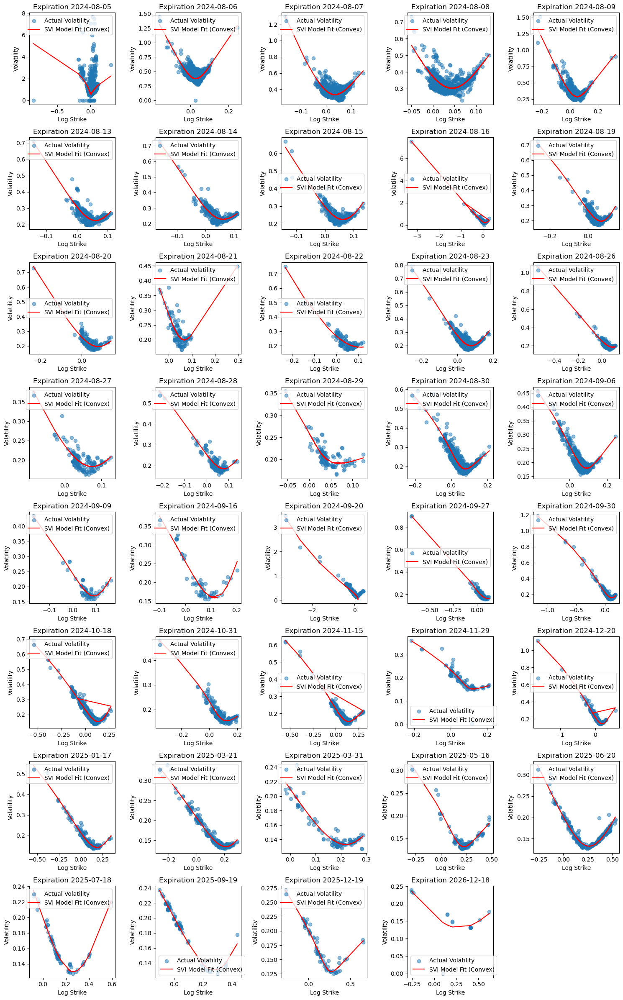

In [14]:
# convexity 제약을 적용한 변동성 스마일 시각화
plt.figure(figsize=(15, rows * 3))  # 전체 그림 크기 설정

for i, expiration in enumerate(expiration_dates, 1):
    # 해당 만기일 데이터 서브셋 선택
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values  # 로그 행사가격
    w_actual = subset['w_actual'].values  # 실제 총 변동성
    
    # convexity 제약 적용 후 최적화된 파라미터 가져오기
    params = svi_params_convex[expiration]
    
    plt.subplot(rows, cols, i)
    plt.scatter(k, np.sqrt(w_actual), label='Actual Volatility', alpha=0.5)
    plt.plot(k, np.sqrt(svi_model(k, *params)), label='SVI Model Fit (Convex)', color='red')
    plt.xlabel('Log Strike')
    plt.ylabel('Volatility')
    plt.title(f'Expiration {expiration}')
    plt.legend()

plt.tight_layout()
plt.show()


In [15]:
# 각 만기일별로 최적화된 파라미터 출력
for expiration, params in svi_params_convex.items():
    print(f"Expiration: {expiration}")
    print(f"Optimized Parameters: {params}\n")

# 만기일별 최적화된 파라미터를 DataFrame으로 저장
result_data_convex = pd.DataFrame.from_dict(svi_params_convex, orient='index', columns=['a', 'b', 'rho', 'm', 'sigma'])
result_data_convex

Expiration: 2024-08-05
Optimized Parameters: [ 1.48221115e-01  2.35779027e+01 -3.27093470e-01  2.29902304e-03
  9.10460471e-03]

Expiration: 2024-08-06
Optimized Parameters: [-5.57609298 23.33782512 -0.23359185 -0.03336359  0.25193668]

Expiration: 2024-08-07
Optimized Parameters: [-8.55691809 48.79117411 -0.74560612 -0.26294467  0.26657459]

Expiration: 2024-08-08
Optimized Parameters: [-17.96560727  39.66277947  -0.51874578  -0.27898308   0.53250891]

Expiration: 2024-08-09
Optimized Parameters: [-2.50296592 11.70936872 -0.45621733 -0.07569296  0.24809987]

Expiration: 2024-08-13
Optimized Parameters: [-1.11244079  5.31584199 -0.10036482  0.03891296  0.21983145]

Expiration: 2024-08-14
Optimized Parameters: [-0.28388116  2.89625269 -0.41473064  0.00343951  0.12742312]

Expiration: 2024-08-15
Optimized Parameters: [-4.45602426 10.45614834  0.29259944  0.20055564  0.45067928]

Expiration: 2024-08-16
Optimized Parameters: [-57.72085759  27.86467653  -0.50765177  -1.31202842   2.40624892

,a,b,rho,m,sigma
2024-08-05,0.148221,23.577903,-0.327093,0.002299,0.009105
2024-08-06,-5.576093,23.337825,-0.233592,-0.033364,0.251937
2024-08-07,-8.556918,48.791174,-0.745606,-0.262945,0.266575
2024-08-08,-17.965607,39.662779,-0.518746,-0.278983,0.532509
2024-08-09,-2.502966,11.709369,-0.456217,-0.075693,0.248100
2024-08-13,-1.112441,5.315842,-0.100365,0.038913,0.219831
2024-08-14,-0.283881,2.896253,-0.414731,0.003440,0.127423
2024-08-15,-4.456024,10.456148,0.292599,0.200556,0.450679
2024-08-16,-57.720858,27.864677,-0.507652,-1.312028,2.406249
2024-08-19,-0.622467,3.613184,0.335964,0.139377,0.194233


이차 미분값에 대한 제약 추가 전후의 곡선을 한 화면에 두고 비교해보자

/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/414589308.py:18: RuntimeWarning: invalid value encountered in sqrt
  plt.plot(k, np.sqrt(svi_model(k, *params_original)), label='Original SVI Fit', color='red')
/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/414589308.py:20: RuntimeWarning: invalid value encountered in sqrt
  plt.plot(k, np.sqrt(svi_model(k, *params_convex)), label='Convex SVI Fit', color='blue')


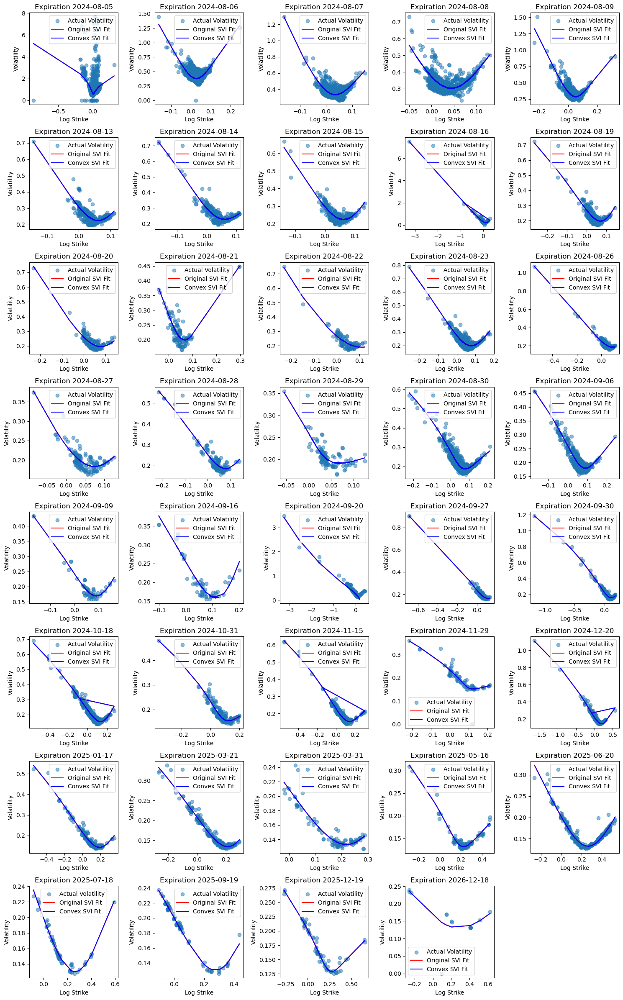

In [16]:
# Step 7: 두 최적화 결과를 한 번에 시각화
plt.figure(figsize=(15, rows * 3))

for i, expiration in enumerate(expiration_dates, 1):
    # 해당 만기일 데이터 서브셋 선택
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values  # 로그 행사가격
    w_actual = subset['w_actual'].values  # 실제 총 변동성
    
    # 최적화된 파라미터 가져오기 (기존 파라미터와 convexity 포함 파라미터)
    params_original = svi_params[expiration]
    params_convex = svi_params_convex[expiration]
    
    plt.subplot(rows, cols, i)
    # 실제 변동성 데이터를 산점도로 그리기
    plt.scatter(k, np.sqrt(w_actual), label='Actual Volatility', alpha=0.5)
    # 기존 최적화된 SVI 모델 곡선
    plt.plot(k, np.sqrt(svi_model(k, *params_original)), label='Original SVI Fit', color='red')
    # convexity 제약을 적용한 SVI 모델 곡선
    plt.plot(k, np.sqrt(svi_model(k, *params_convex)), label='Convex SVI Fit', color='blue')
    
    plt.xlabel('Log Strike')
    plt.ylabel('Volatility')
    plt.title(f'Expiration {expiration}')
    plt.legend()

plt.tight_layout()
plt.show()


결과가 동일함

그리고 아무튼 여전히 convex하지 않은 smile이 보임(ex. Expiration 2024-11-15, 2024-12-20 etc)..

convexity 제약 조건을 보다 엄격하게 만들어서 이차 미분값이 항상 0보다 크게끔 유지해야함

## 방법 1: 이차 미분의 하한 설정

곡선이 완전한 convex 형태를 띠도록 이차 미분값이 단순히 0 이상이 아닌, 특정 작은 값(예: ε) 이상이 되도록 제약을 추가해보자.. 곡선이 거의 flat해지지 않고 항상 convex를 유지하도록 강제 ㄱㄱ

일단 이게 좋다!!!!

/Users/justhaji/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minimize.py:565: RuntimeWarning: Method L-BFGS-B cannot handle constraints.
  warn('Method %s cannot handle constraints.' % method,
/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/1627542359.py:39: RuntimeWarning: invalid value encountered in sqrt
  plt.plot(k, np.sqrt(svi_model(k, *params)), label='SVI Model Fit (Strict Convex)', color='red')


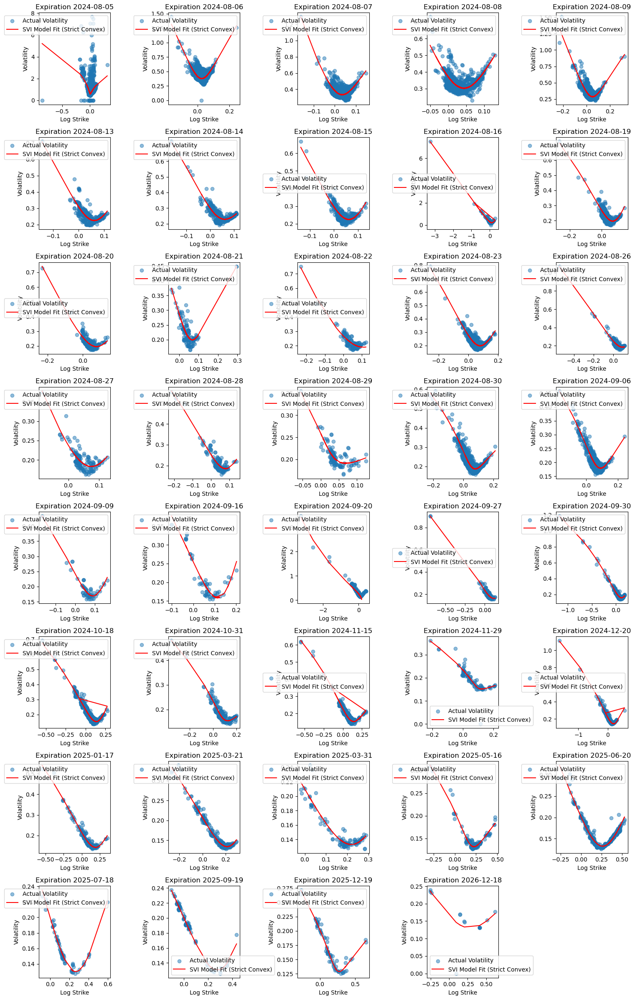

In [17]:
# strict convexity 제약 조건 함수
def strict_convexity_constraint(params, k, epsilon=1e-4):
    """
    이차 미분의 하한을 설정하여 더 엄격한 convexity 조건을 부과하는 함수
    """
    # SVI 모델의 이차 미분값 계산 (곡선의 convexity 확인)
    second_derivs = second_derivative_constraint(params, k)
    return second_derivs - epsilon  # 이차 미분이 epsilon 이상이어야 함

# Step 7: strict convexity를 적용한 최적화 수행
strict_svi_params = {}
for expiration in expiration_dates:
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values
    w_actual = subset['w_actual'].values
    
    # strict convexity를 제약으로 추가
    strict_constraints = constraints + [{'type': 'ineq', 'fun': strict_convexity_constraint, 'args': (k,)}]
    
    # 최적화 수행 (strict convexity 적용)
    result = minimize(objective_function, initial_params, args=(k, w_actual),
                      method='L-BFGS-B', bounds=bounds, constraints=strict_constraints)
    
    # 최적화된 파라미터 저장
    strict_svi_params[expiration] = result.x

# Step 8: strict convexity가 적용된 변동성 스마일 시각화
plt.figure(figsize=(15, rows * 3))

for i, expiration in enumerate(expiration_dates, 1):
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values
    w_actual = subset['w_actual'].values
    
    params = strict_svi_params[expiration]
    
    plt.subplot(rows, cols, i)
    plt.scatter(k, np.sqrt(w_actual), label='Actual Volatility', alpha=0.5)
    plt.plot(k, np.sqrt(svi_model(k, *params)), label='SVI Model Fit (Strict Convex)', color='red')
    plt.xlabel('Log Strike')
    plt.ylabel('Volatility')
    plt.title(f'Expiration {expiration}')
    plt.legend()

plt.tight_layout()
plt.show()


결과 저장하자

In [18]:
# 각 만기일별로 최적화된 파라미터 출력
for expiration, params in strict_svi_params.items():
    print(f"Expiration: {expiration}")
    print(f"Optimized Parameters: {params}\n")


# 만기일별 최적화된 파라미터를 DataFrame으로 저장
result_data_1st_fitting_strict = pd.DataFrame.from_dict(strict_svi_params, orient='index', columns=['a', 'b', 'rho', 'm', 'sigma'])
result_data_1st_fitting_strict


Expiration: 2024-08-05
Optimized Parameters: [ 1.48221115e-01  2.35779027e+01 -3.27093470e-01  2.29902304e-03
  9.10460471e-03]

Expiration: 2024-08-06
Optimized Parameters: [-5.57609298 23.33782512 -0.23359185 -0.03336359  0.25193668]

Expiration: 2024-08-07
Optimized Parameters: [-8.55691809 48.79117411 -0.74560612 -0.26294467  0.26657459]

Expiration: 2024-08-08
Optimized Parameters: [-17.96560727  39.66277947  -0.51874578  -0.27898308   0.53250891]

Expiration: 2024-08-09
Optimized Parameters: [-2.50296592 11.70936872 -0.45621733 -0.07569296  0.24809987]

Expiration: 2024-08-13
Optimized Parameters: [-1.11244079  5.31584199 -0.10036482  0.03891296  0.21983145]

Expiration: 2024-08-14
Optimized Parameters: [-0.28388116  2.89625269 -0.41473064  0.00343951  0.12742312]

Expiration: 2024-08-15
Optimized Parameters: [-4.45602426 10.45614834  0.29259944  0.20055564  0.45067928]

Expiration: 2024-08-16
Optimized Parameters: [-57.72085759  27.86467653  -0.50765177  -1.31202842   2.40624892

,a,b,rho,m,sigma
2024-08-05,0.148221,23.577903,-0.327093,0.002299,0.009105
2024-08-06,-5.576093,23.337825,-0.233592,-0.033364,0.251937
2024-08-07,-8.556918,48.791174,-0.745606,-0.262945,0.266575
2024-08-08,-17.965607,39.662779,-0.518746,-0.278983,0.532509
2024-08-09,-2.502966,11.709369,-0.456217,-0.075693,0.248100
2024-08-13,-1.112441,5.315842,-0.100365,0.038913,0.219831
2024-08-14,-0.283881,2.896253,-0.414731,0.003440,0.127423
2024-08-15,-4.456024,10.456148,0.292599,0.200556,0.450679
2024-08-16,-57.720858,27.864677,-0.507652,-1.312028,2.406249
2024-08-19,-0.622467,3.613184,0.335964,0.139377,0.194233


In [19]:
result_data_1st_fitting_strict.to_csv('optimized_parameter_call.csv')

/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/3256293473.py:18: RuntimeWarning: invalid value encountered in sqrt
  plt.plot(k, np.sqrt(svi_model(k, *params_original)), label='Original SVI Fit', color='red')
/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/3256293473.py:20: RuntimeWarning: invalid value encountered in sqrt
  plt.plot(k, np.sqrt(svi_model(k, *params_strict)), label='Strict Convex SVI Fit', color='blue')


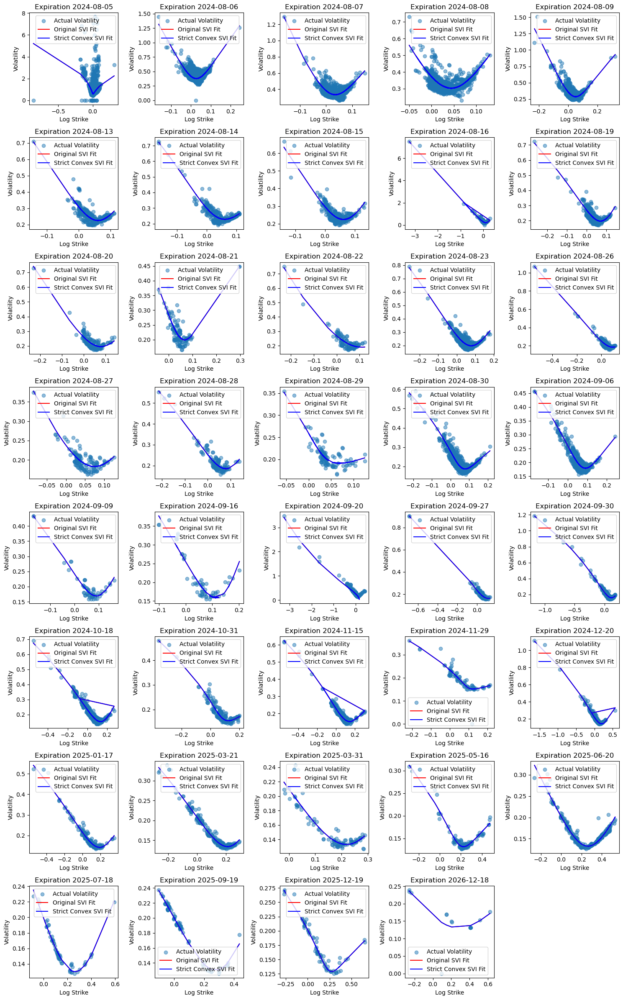

In [20]:
# Step 7: 두 최적화 결과를 한 번에 시각화
plt.figure(figsize=(15, rows * 3))

for i, expiration in enumerate(expiration_dates, 1):
    # 해당 만기일 데이터 서브셋 선택
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values  # 로그 행사가격
    w_actual = subset['w_actual'].values  # 실제 총 변동성
    
    # 최적화된 파라미터 가져오기 (기존 파라미터와 convexity 포함 파라미터)
    params_original = svi_params[expiration]
    params_strict = strict_svi_params[expiration]
    
    plt.subplot(rows, cols, i)
    # 실제 변동성 데이터를 산점도로 그리기
    plt.scatter(k, np.sqrt(w_actual), label='Actual Volatility', alpha=0.5)
    # 기존 최적화된 SVI 모델 곡선
    plt.plot(k, np.sqrt(svi_model(k, *params_original)), label='Original SVI Fit', color='red')
    # convexity epsilon 제약을 적용한 SVI 모델 곡선
    plt.plot(k, np.sqrt(svi_model(k, *params_strict)), label='Strict Convex SVI Fit', color='blue')
    
    plt.xlabel('Log Strike')
    plt.ylabel('Volatility')
    plt.title(f'Expiration {expiration}')
    plt.legend()

plt.tight_layout()
plt.show()


## 방법 2: 모든 로그 행사가격에 대한 convexity 제약

현재는 log_strike (k)에 대해 곡선이 convex해야 한다는 조건이 있지만, k의 모든 값에 대해 convex한지를 확인하는 것이 중요함. 이를 위해 k의 모든 가능한 값을 사용하는 대신 미리 일정한 간격으로 k의 샘플링된 점들을 만들어 convexity 확인

/Users/justhaji/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minimize.py:565: RuntimeWarning: Method L-BFGS-B cannot handle constraints.
  warn('Method %s cannot handle constraints.' % method,
/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/2143896696.py:41: RuntimeWarning: invalid value encountered in sqrt
  plt.plot(k, np.sqrt(svi_model(k, *params)), label='SVI Model Fit (Penalized)', color='blue')


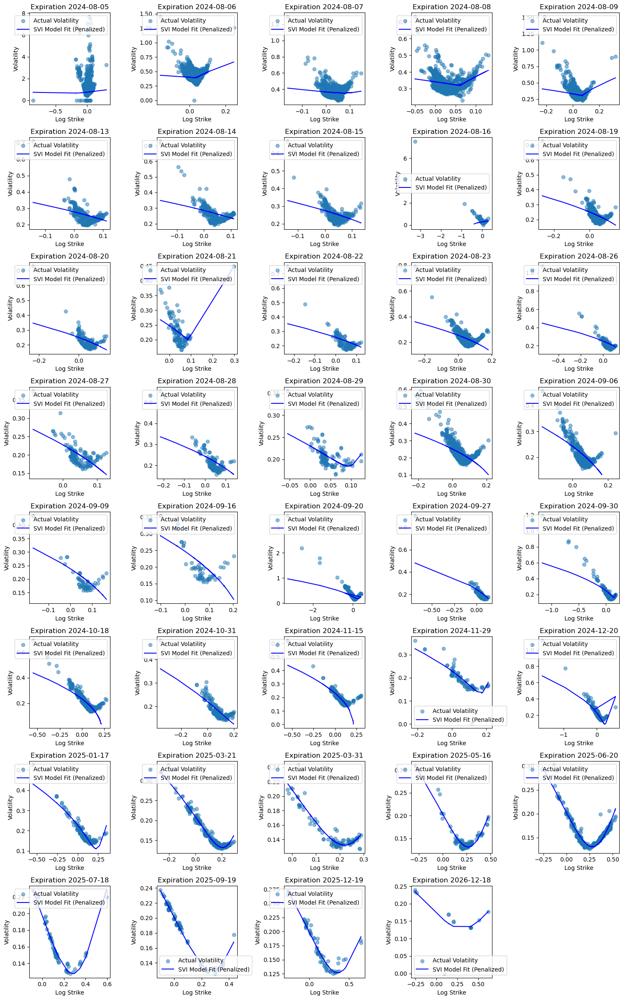

In [21]:
# convexity를 강화하는 패널티 함수 추가
def convexity_penalty(params, k, penalty_weight=100):
    """
    이차 미분이 음수일 경우 패널티를 추가하는 함수
    """
    second_derivs = second_derivative_constraint(params, k)
    # 음수인 이차 미분에 패널티 부과
    penalty = penalty_weight * np.sum(np.minimum(second_derivs, 0) ** 2)
    return penalty

# 목적 함수에 convexity 패널티 추가
def penalized_objective_function(params, k, w_actual, penalty_weight=100):
    return objective_function(params, k, w_actual) + convexity_penalty(params, k, penalty_weight)

# Step 7: convexity 패널티가 적용된 최적화 수행
penalized_svi_params = {}
for expiration in expiration_dates:
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values
    w_actual = subset['w_actual'].values
    
    # 패널티를 적용한 최적화 수행
    result = minimize(penalized_objective_function, initial_params, args=(k, w_actual, 100),
                      method='L-BFGS-B', bounds=bounds, constraints=constraints)
    
    # 최적화된 파라미터 저장
    penalized_svi_params[expiration] = result.x

# Step 8: convexity 패널티가 적용된 변동성 스마일 시각화
plt.figure(figsize=(15, rows * 3))

for i, expiration in enumerate(expiration_dates, 1):
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values
    w_actual = subset['w_actual'].values
    
    params = penalized_svi_params[expiration]
    
    plt.subplot(rows, cols, i)
    plt.scatter(k, np.sqrt(w_actual), label='Actual Volatility', alpha=0.5)
    plt.plot(k, np.sqrt(svi_model(k, *params)), label='SVI Model Fit (Penalized)', color='blue')
    plt.xlabel('Log Strike')
    plt.ylabel('Volatility')
    plt.title(f'Expiration {expiration}')
    plt.legend()

plt.tight_layout()
plt.show()


이건 오히려 망했고

## 방법 3: 곡선 smoothing(평활화)

SVI 모델 자체가 오버피팅되거나, 급격하게 변하는 형태를 나타내는 경우라면 목적 함수에 평활화(smoothing) 항을 추가하여 모델의 변동성을 줄이는 방식으로 convexity를 강화할 수 있음. 이를 위해 목적 함수에 페널티 항 추가

/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/6973006.py:49: RuntimeWarning: invalid value encountered in sqrt
  plt.plot(k, np.sqrt(svi_model(k, *params)), label='SVI Model Fit (Transformed)', color='green')


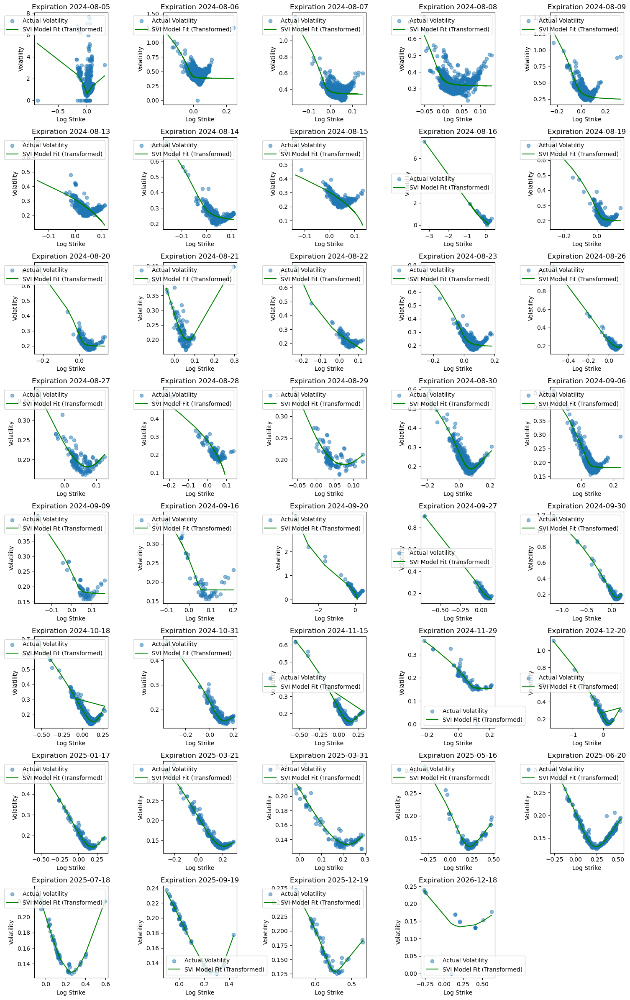

In [22]:
# 변수 변환을 통한 제약 조건 적용
def transformed_params_to_original(params):
    """
    변수 변환 후 원래 파라미터 값으로 되돌리는 함수
    """
    a, b_tilde, rho_tilde, m, sigma_tilde = params
    # b와 sigma는 양수로, rho는 (-1, 1) 범위로 변환
    b = np.exp(b_tilde)
    rho = np.tanh(rho_tilde)
    sigma = np.exp(sigma_tilde)
    return [a, b, rho, m, sigma]

def transformed_objective_function(params, k, w_actual):
    # 변수 변환을 적용하여 원래 파라미터로 복원
    original_params = transformed_params_to_original(params)
    return objective_function(original_params, k, w_actual)

# Step 7: 변수 변환 적용 최적화 수행
transformed_svi_params = {}
for expiration in expiration_dates:
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values
    w_actual = subset['w_actual'].values
    
    # 변수 변환된 초기값 설정 (로그나 tanh를 사용하여 기존 초기값 변환)
    initial_transformed_params = [initial_params[0], np.log(initial_params[1]),
                                  np.arctanh(initial_params[2]), initial_params[3],
                                  np.log(initial_params[4])]
    
    # 최적화 수행 (변수 변환 적용)
    result = minimize(transformed_objective_function, initial_transformed_params, args=(k, w_actual),
                      method='L-BFGS-B')
    
    # 최적화된 파라미터 저장 (변환 후 원래 파라미터로 되돌림)
    transformed_svi_params[expiration] = transformed_params_to_original(result.x)

# Step 8: 변수 변환을 적용한 변동성 스마일 시각화
plt.figure(figsize=(15, rows * 3))

for i, expiration in enumerate(expiration_dates, 1):
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values
    w_actual = subset['w_actual'].values
    
    params = transformed_svi_params[expiration]
    
    plt.subplot(rows, cols, i)
    plt.scatter(k, np.sqrt(w_actual), label='Actual Volatility', alpha=0.5)
    plt.plot(k, np.sqrt(svi_model(k, *params)), label='SVI Model Fit (Transformed)', color='green')
    plt.xlabel('Log Strike')
    plt.ylabel('Volatility')
    plt.title(f'Expiration {expiration}')
    plt.legend()

plt.tight_layout()
plt.show()


방법1이 제일 좋다! 우선 방법1 결과 저장해~

In [23]:
# Step 9: 최적화 결과를 DataFrame으로 변환
params_list = []

for expiration, params in strict_svi_params.items():
    params_list.append({
        'Expiration': expiration,
        'a': params[0],
        'b': params[1],
        'rho': params[2],
        'm': params[3],
        'sigma': params[4]
    })

# DataFrame 생성
params_df = pd.DataFrame(params_list)

# CSV 파일로 저장
params_df.to_csv('svi_optimized_params_sol1.csv', index=False)


In [24]:
svi_optimizeed_params_sol1 = pd.read_csv('svi_optimized_params_sol1.csv')

svi_optimizeed_params_sol1

,Expiration,a,b,rho,m,sigma
0,2024-08-05,0.148221,23.577903,-0.327093,0.002299,0.009105
1,2024-08-06,-5.576093,23.337825,-0.233592,-0.033364,0.251937
2,2024-08-07,-8.556918,48.791174,-0.745606,-0.262945,0.266575
3,2024-08-08,-17.965607,39.662779,-0.518746,-0.278983,0.532509
4,2024-08-09,-2.502966,11.709369,-0.456217,-0.075693,0.248100
5,2024-08-13,-1.112441,5.315842,-0.100365,0.038913,0.219831
6,2024-08-14,-0.283881,2.896253,-0.414731,0.003440,0.127423
7,2024-08-15,-4.456024,10.456148,0.292599,0.200556,0.450679
8,2024-08-16,-57.720858,27.864677,-0.507652,-1.312028,2.406249
9,2024-08-19,-0.622467,3.613184,0.335964,0.139377,0.194233


우선 이게 최적화 돌렸을 때의 파라미터 값. 파라미터 초기값을 [-0.041, 0.1331, 0.306, 0.3586, 0.4153]로 두고 L-BFGS-B 최적화 (+ 2차 미분값 >= 0 제약조건 추가) 수행했을 때 도출된 결과임!

이 결과를 통해 만기일별로 최적화가 과연 잘 이루어진 것인지 확인해보자

#### 최적화 결과 검증 1. Loss Function 변화 tracking

최적화 과정에서 목적함수(objective_function) 값이 감소했는지 확인하고, loss가 크게 줄어들었다면 최적화가 잘 이루어졌다고 봐야함

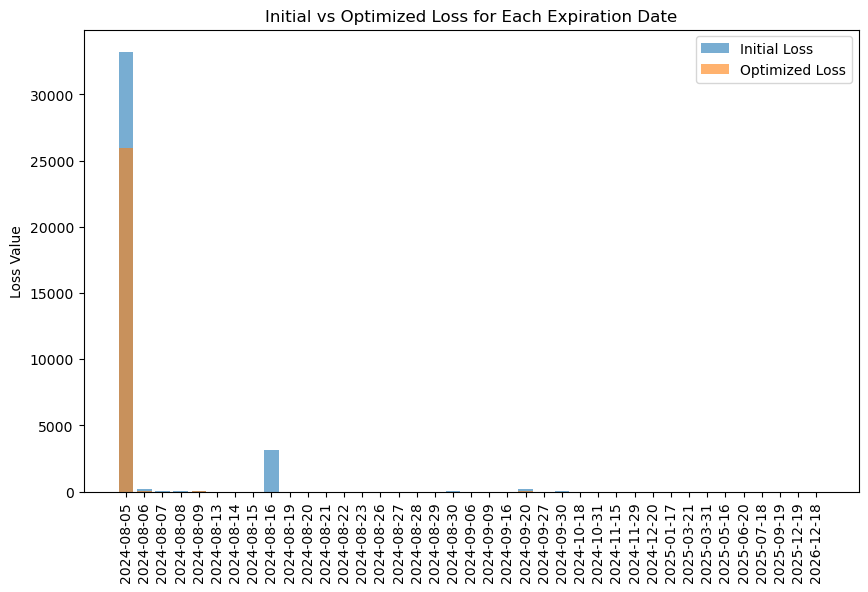

In [25]:
initial_losses = []
optimized_losses = []
expiration_list = []

for expiration in expiration_dates:
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values
    w_actual = subset['w_actual'].values
    
    # Initial loss 계산
    initial_loss = objective_function(initial_params, k, w_actual)
    optimized_loss = objective_function(svi_params[expiration], k, w_actual)
    
    initial_losses.append(initial_loss)
    optimized_losses.append(optimized_loss)
    expiration_list.append(expiration)

# 시각화
plt.figure(figsize=(10, 6))
plt.bar(expiration_list, initial_losses, alpha=0.6, label='Initial Loss')
plt.bar(expiration_list, optimized_losses, alpha=0.6, label='Optimized Loss')
plt.xticks(rotation=90)
plt.ylabel('Loss Value')
plt.title('Initial vs Optimized Loss for Each Expiration Date')
plt.legend()
plt.show()


최적화의 목적은 초기 손실 값(Initial Loss)을 줄여서 실제 변동성에 더 잘 맞는 SVI 모델을 도출하는 것이다. 주황색 막대가 파란색보다 작거나 적어도 비슷한 크기여야 최적화가 성공적으로 이루어졌다고 볼 수 있다. 그러나 주황색 막대가 파란색보다 크다면, 최적화 과정이 손실을 줄이는 데 실패했거나 오히려 초기보다 더 높은 손실 값을 만들었다는 뜻을 의미한다.

결론) 뭔가 잘못됐다


근데 8월 5일 데이터이다보니 같은 날 만기일 데이터에 대해서는 워낙에 노이즈가 많았을 테니까, 우선 그날 제외하고 다른 만기일 옵션 데이터로만 시각화해서, 나머지 데이터에 대한 최적화 성능을 검토해보자

### sol1 Global Optima vs Local Optima

In [26]:
# sys.stdout = open('results_data_call.txt', 'w')

# Step 7: 다양한 초기값으로 최적화 수행 및 결과 비교
num_initial_guesses = 10  # 시도할 초기값의 수
initial_guesses = [np.random.uniform(-0.5, 0.5, 5) for _ in range(num_initial_guesses)]  # [a, b, rho, m, sigma]

# 만기일별로 다양한 초기값을 사용하여 최적화 및 비교
for expiration in expiration_dates:
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values  # 로그 행사가격
    w_actual = subset['w_actual'].values  # 실제 총 변동성

    print(f"\n### Expiration: {expiration} ###")

    best_params = svi_params[expiration]  # 기존 최적화된 파라미터
    best_objective_value = objective_function(best_params, k, w_actual)

    print(f"Initial best objective value: {best_objective_value}")
    print(f"Initial best parameters: {best_params}")

    # 각 초기값에 대한 최적화 결과를 저장
    for idx, initial_params in enumerate(initial_guesses):
        result = minimize(objective_function, initial_params, args=(k, w_actual),
                          method='L-BFGS-B', bounds=bounds, constraints=constraints)
        
        objective_value = result.fun
        params = result.x
        
        # print(f"\nTrial {idx + 1} - Initial Guess: {initial_params}")
        # print(f"Objective Value: {objective_value}")
        # print(f"Parameters: {params}")
        
        # 기존의 최적화된 파라미터와 비교
        if objective_value < best_objective_value:
            print(f"New optimal found with lower objective value: {objective_value}")
            best_objective_value = objective_value
            best_params = params

    print(f"\nFinal best objective value for expiration {expiration}: {best_objective_value}")
    print(f"Final best parameters for expiration {expiration}: {best_params}")

# sys.stdout.close()



### Expiration: 2024-08-05 ###
Initial best objective value: 25916.196432886274
Initial best parameters: [ 1.48221115e-01  2.35779027e+01 -3.27093470e-01  2.29902304e-03
  9.10460471e-03]


/Users/justhaji/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minimize.py:565: RuntimeWarning: Method L-BFGS-B cannot handle constraints.
  warn('Method %s cannot handle constraints.' % method,


New optimal found with lower objective value: 25916.19642081221

Final best objective value for expiration 2024-08-05: 25916.19642081221
Final best parameters for expiration 2024-08-05: [ 1.48265991e-01  2.35770878e+01 -3.27079297e-01  2.30065050e-03
  9.10138498e-03]

### Expiration: 2024-08-06 ###
Initial best objective value: 8.663435583502265
Initial best parameters: [-5.57609298 23.33782512 -0.23359185 -0.03336359  0.25193668]
New optimal found with lower objective value: 8.663421715784828

Final best objective value for expiration 2024-08-06: 8.663421715784828
Final best parameters for expiration 2024-08-06: [-5.59488123 23.37901222 -0.23388872 -0.03354221  0.25233782]

### Expiration: 2024-08-07 ###
Initial best objective value: 1.7832370459492173
Initial best parameters: [-8.55691809 48.79117411 -0.74560612 -0.26294467  0.26657459]
New optimal found with lower objective value: 1.7832258449564393

Final best objective value for expiration 2024-08-07: 1.7832258449564393
Final bes

아래 코드는 위에서 도출한 결과값을 저장한 텍스트 파일을 'results_data'로 저장하는 코드임

In [27]:
import re

# 텍스트 파일에서 데이터를 읽어오는 함수
def read_text_file(file_path):
    with open(file_path, 'r', encoding='utf-8') as file:
        text_data = file.read()
    return text_data

# 텍스트 데이터를 파싱하는 함수
def parse_optimization_text(text):
    # 만기일별 결과를 저장할 딕셔너리
    results_data = {}

    # 만기일별 텍스트 블록 분리
    expiration_blocks = text.strip().split('### Expiration: ')
    
    for block in expiration_blocks:
        if not block.strip():
            continue  # 빈 블록 무시
        
        # 만기일 추출
        expiration_match = re.search(r'(\d{4}-\d{2}-\d{2})', block)
        if expiration_match:
            expiration = expiration_match.group(1)
        else:
            continue

        # 초기 최적화 objective value 추출
        initial_obj_match = re.search(r'Initial best objective value: ([\d.]+)', block)
        initial_obj_value = float(initial_obj_match.group(1)) if initial_obj_match else None

        # 초기 최적화 파라미터 추출 (줄바꿈 및 여분의 공백 제거)
        initial_params_match = re.search(r'Initial best parameters: \[([^\]]+)\]', block, re.DOTALL)
        if initial_params_match:
            # 파라미터 값을 한 줄로 만들고, 여분의 공백과 줄바꿈 제거 후 분리
            initial_params_str = re.sub(r'\s+', ' ', initial_params_match.group(1).strip())
            initial_params = [float(x) for x in initial_params_str.split()]
        else:
            initial_params = None

        # 최종 최적화 objective value 추출
        final_obj_match = re.search(r'Final best objective value for expiration \d{4}-\d{2}-\d{2}: ([\d.]+)', block)
        final_obj_value = float(final_obj_match.group(1)) if final_obj_match else None

        # 최종 최적화 파라미터 추출 (줄바꿈 및 여분의 공백 제거)
        final_params_match = re.search(r'Final best parameters for expiration \d{4}-\d{2}-\d{2}: \[([^\]]+)\]', block, re.DOTALL)
        if final_params_match:
            # 파라미터 값을 한 줄로 만들고, 여분의 공백과 줄바꿈 제거 후 분리
            final_params_str = re.sub(r'\s+', ' ', final_params_match.group(1).strip())
            final_params = [float(x) for x in final_params_str.split()]
        else:
            final_params = None
        
        # 결과 저장
        results_data[expiration] = {
            'initial_best_value': initial_obj_value,
            'final_best_value': final_obj_value,
            'initial_best_params': initial_params,
            'final_best_params': final_params,
        }
    
    return results_data

# 파일 경로 설정
file_path = 'results_data_call.txt'

# Step 1: 텍스트 파일에서 데이터 읽어오기
text_data = read_text_file(file_path)

# Step 2: 텍스트 데이터 파싱
results_data = parse_optimization_text(text_data)

# 결과 출력
print(results_data)


{'2024-08-05': {'initial_best_value': 25916.196432886274, 'final_best_value': 25916.19642073275, 'initial_best_params': [0.148221115, 23.5779027, -0.32709347, 0.00229902304, 0.00910460471], 'final_best_params': [0.148261058, 23.5772129, -0.327076478, 0.00230079837, 0.00910154291]}, '2024-08-06': {'initial_best_value': 8.663435583502265, 'final_best_value': 8.663435583502265, 'initial_best_params': [-5.57609298, 23.33782512, -0.23359185, -0.03336359, 0.25193668], 'final_best_params': [-5.57609298, 23.33782512, -0.23359185, -0.03336359, 0.25193668]}, '2024-08-07': {'initial_best_value': 1.7832370459492173, 'final_best_value': 1.7832370459492173, 'initial_best_params': [-8.55691809, 48.79117411, -0.74560612, -0.26294467, 0.26657459], 'final_best_params': [-8.55691809, 48.79117411, -0.74560612, -0.26294467, 0.26657459]}, '2024-08-08': {'initial_best_value': 0.743822355420566, 'final_best_value': 0.7203815786514874, 'initial_best_params': [-17.96560727, 39.66277947, -0.51874578, -0.27898308

### sol1 최적화 결과 평가

code alpha

In [28]:
# 각 만기일별 최적화 결과를 평가하는 함수
def evaluate_optimization(expiration_dates, svi_params, results_data):
    evaluation_summary = []

    for expiration in expiration_dates:
        # 초기 최적화 결과 추출
        initial_best_value = results_data[expiration]['initial_best_value']
        final_best_value = results_data[expiration]['final_best_value']
        initial_best_params = results_data[expiration]['initial_best_params']
        final_best_params = results_data[expiration]['final_best_params']

        # Objective value 차이 (퍼센트 차이)
        value_diff_percent = ((initial_best_value - final_best_value) / initial_best_value) * 100

        # 파라미터의 일관성 확인 (각 파라미터의 절대 차이)
        param_diff = np.abs(np.array(initial_best_params) - np.array(final_best_params))

        # 최종 평가 결과 저장
        evaluation_summary.append({
            'Expiration': expiration,
            'Initial Objective Value': initial_best_value,
            'Final Objective Value': final_best_value,
            'Objective Value Change (%)': value_diff_percent,
            'Parameter Differences': param_diff,
        })

    # DataFrame으로 결과 정리 및 표시
    summary_df = pd.DataFrame(evaluation_summary)
    print(summary_df)

    return summary_df


# 최적화 평가 수행
evaluation_summary_df = evaluate_optimization(expiration_dates, svi_params, results_data)


evaluation_summary_df.to_csv('optimization_summary.csv', index=False)


    Expiration  Initial Objective Value  Final Objective Value  \
0   2024-08-05             25916.196433           25916.196421   
1   2024-08-06                 8.663436               8.663436   
2   2024-08-07                 1.783237               1.783237   
3   2024-08-08                 0.743822               0.720382   
4   2024-08-09                 3.362165               3.362165   
5   2024-08-13                 0.090707               0.090707   
6   2024-08-14                 0.058836               0.058442   
7   2024-08-15                 0.057653               0.056228   
8   2024-08-16                 1.902195               1.897677   
9   2024-08-19                 0.065430               0.065430   
10  2024-08-20                 0.025104               0.020758   
11  2024-08-21                 0.019558               0.019558   
12  2024-08-22                 0.019123               0.018924   
13  2024-08-23                 0.089246               0.089176   
14  2024-0

여기까지

### Objective Value의 변화율이 큰 데이터에 대해 추가적인 최적화 진행

In [29]:
# 최적화 대상 만기일 선택 (만약 Objective Value 변화율이 1% 이상인 경우로 둔다면)
threshold = 1  # 변화율 기준 (1% 이상인 경우만 추가 최적화)
target_expirations = evaluation_summary_df[
    evaluation_summary_df['Objective Value Change (%)'] > threshold
]['Expiration'].tolist()

print("Additional Optimization Needed for Expirations:", target_expirations)


Additional Optimization Needed for Expirations: ['2024-08-08', '2024-08-15', '2024-08-20', '2024-08-22', '2024-08-27', '2024-09-09', '2024-09-16', '2024-09-20', '2024-09-30', '2025-06-20']


In [30]:
# 초기 파라미터 변경
# 이전에 최적화한 결과가 local optima에 빠져 global optima에 도달하지 못할 수 있으므로, 초기 파라미터를 다양하게 설정하여 최적화

# 추가 최적화를 진행할 함수
def re_optimize(expiration, initial_params):
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values
    w_actual = subset['w_actual'].values
    
    # 이전 최적화의 파라미터를 새 초기값으로 사용
    bounds = [(None, None), (0, None), (-1, 1), (None, None), (0, None)]
    result = minimize(objective_function, initial_params, args=(k, w_actual),
                      method='L-BFGS-B', bounds=bounds)
    
    return result

# 대상 만기일에 대해 추가 최적화 진행
for expiration in target_expirations:
    # 초기 파라미터를 다양하게 설정 (예: 이전 최적화 결과를 기준으로 약간 변형)
    current_params = svi_params[expiration]
    new_initial_params = [
        current_params * (1 + np.random.uniform(-0.1, 0.1, size=len(current_params)))
        for _ in range(5)  # 예를 들어, 5번의 다른 초기값으로 최적화 시도
    ]

    best_result = None
    for initial_params in new_initial_params:
        result = re_optimize(expiration, initial_params)
        if best_result is None or result.fun < best_result.fun:
            best_result = result
    
    # 최적화 결과 갱신
    svi_params[expiration] = best_result.x
    print(f"Re-optimized parameters for expiration {expiration}: {best_result.x}")


Re-optimized parameters for expiration 2024-08-08: [-16.74861958  40.88475051  -0.56207175  -0.29439745   0.49799434]
Re-optimized parameters for expiration 2024-08-15: [-4.18108469 10.32236224  0.3120466   0.2043276   0.43143975]
Re-optimized parameters for expiration 2024-08-20: [-35.39226524  70.36874635  -0.86227617  -1.6137671    0.99419349]
Re-optimized parameters for expiration 2024-08-22: [-2.10462071 14.9049622  -0.88336548 -0.4666336   0.3063532 ]
Re-optimized parameters for expiration 2024-08-27: [-2.35615294  4.6018868  -0.19214235 -0.02907683  0.52908367]
Re-optimized parameters for expiration 2024-09-09: [-0.11543649  1.16949149  0.17997526  0.11421047  0.12519035]
Re-optimized parameters for expiration 2024-09-16: [-0.66156672  5.65922506  0.76304195  0.33513629  0.18765476]
Re-optimized parameters for expiration 2024-09-20: [-6.73060293 33.3282223  -0.9832475  -3.99874652  1.05599209]
Re-optimized parameters for expiration 2024-09-30: [-1.08320676  3.78797974  0.6072618

In [31]:
# 재평가

# 추가 최적화 후의 결과를 다시 평가
evaluation_summary_df_updated = evaluate_optimization(expiration_dates, svi_params, results_data)

# 새로운 평가 결과 저장
evaluation_summary_df_updated.to_csv('updated_optimization_summary.csv', index=False)


    Expiration  Initial Objective Value  Final Objective Value  \
0   2024-08-05             25916.196433           25916.196421   
1   2024-08-06                 8.663436               8.663436   
2   2024-08-07                 1.783237               1.783237   
3   2024-08-08                 0.743822               0.720382   
4   2024-08-09                 3.362165               3.362165   
5   2024-08-13                 0.090707               0.090707   
6   2024-08-14                 0.058836               0.058442   
7   2024-08-15                 0.057653               0.056228   
8   2024-08-16                 1.902195               1.897677   
9   2024-08-19                 0.065430               0.065430   
10  2024-08-20                 0.025104               0.020758   
11  2024-08-21                 0.019558               0.019558   
12  2024-08-22                 0.019123               0.018924   
13  2024-08-23                 0.089246               0.089176   
14  2024-0

In [32]:
evaluation_summary_df_updated

,Expiration,Initial Objective Value,Final Objective Value,Objective Value Change (%),Parameter Differences
0,2024-08-05,25916.196433,25916.196421,4.689547e-08,"[3.9943000000014495e-05, 0.0006897999999999627..."
1,2024-08-06,8.663436,8.663436,0.000000e+00,"[0.0, 0.0, 0.0, 0.0, 0.0]"
2,2024-08-07,1.783237,1.783237,0.000000e+00,"[0.0, 0.0, 0.0, 0.0, 0.0]"
3,2024-08-08,0.743822,0.720382,3.151394e+00,"[16.88570857, 4.178983189999997, 0.37941970999..."
4,2024-08-09,3.362165,3.362165,0.000000e+00,"[0.0, 0.0, 0.0, 0.0, 0.0]"
5,2024-08-13,0.090707,0.090707,0.000000e+00,"[0.0, 0.0, 0.0, 0.0, 0.0]"
6,2024-08-14,0.058836,0.058442,6.690673e-01,"[0.57089338, 1.4803875900000003, 0.19012564999..."
7,2024-08-15,0.057653,0.056228,2.471642e+00,"[4.43206824, 8.81639332, 0.7494065400000001, 0..."
8,2024-08-16,1.902195,1.897677,2.375122e-01,"[1.8646796899999956, 0.37846811, 0.00272773999..."
9,2024-08-19,0.065430,0.065430,0.000000e+00,"[0.0, 0.0, 0.0, 0.0, 0.0]"


### 그냥.... L-BFGS-B가 부적합한 게 아닐까.. gradien descent 방법으로 해보자

/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/3649356937.py:5: RuntimeWarning: overflow encountered in multiply
  return a + b * (rho * (k - m) + np.sqrt((k - m)**2 + sigma**2))
/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/3649356937.py:5: RuntimeWarning: invalid value encountered in add
  return a + b * (rho * (k - m) + np.sqrt((k - m)**2 + sigma**2))
/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/1561764596.py:21: RuntimeWarning: invalid value encountered in add
  grad[1] = np.sum(2 * diff * (rho * (k - m) + np.sqrt((k - m)**2 + sigma**2)))  # b에 대한 그레이디언트
/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/1561764596.py:23: RuntimeWarning: invalid value encountered in divide
  grad[3] = np.sum(2 * diff * b * (-rho + (k - m) / np.sqrt((k - m)**2 + sigma**2)))  # m에 대한 그레이디언트
/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/3649356937.py:5: RuntimeWarning: overflow encountered in square
  return a + b * (

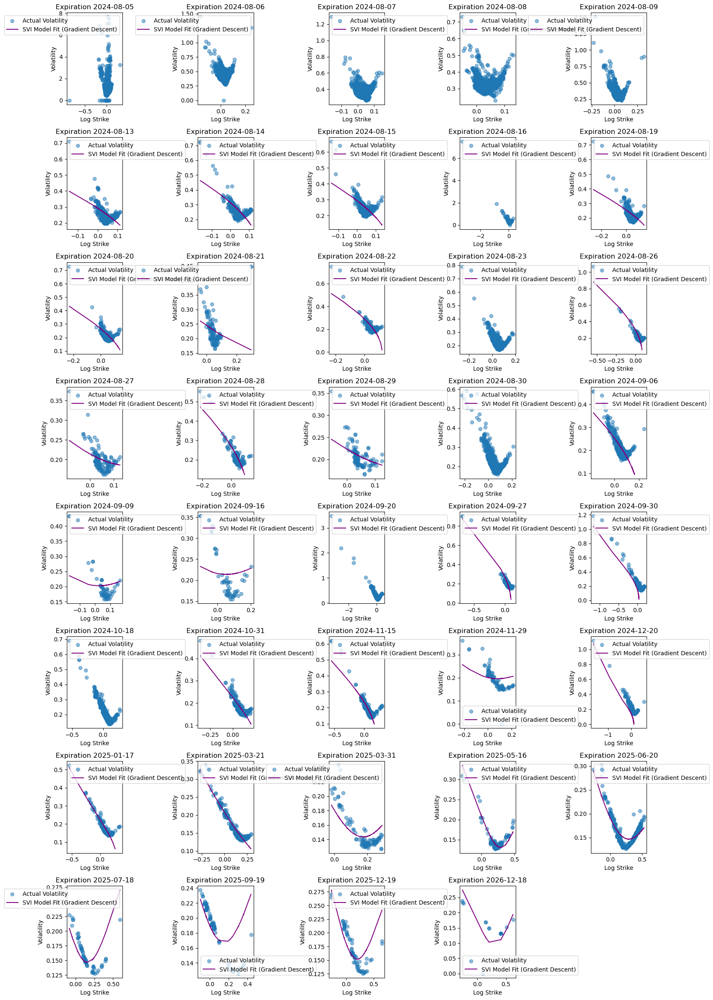

In [33]:
# Gradient Descent 최적화를 위한 설정
learning_rate = 0.001  # 학습률
iterations = 5000  # 반복 횟수
tolerance = 1e-6  # 수렴 조건
epsilon = 1e-8  # 수치 안정성을 위한 작은 값

# 손실 함수의 그레이디언트를 계산하는 함수
def gradient_objective(params, k, w_actual):
    """
    손실 함수에 대한 그레이디언트 계산
    """
    a, b, rho, m, sigma = params
    grad = np.zeros_like(params)
    
    # SVI 모델에 대한 예측값 및 차이 계산
    w_pred = svi_model(k, a, b, rho, m, sigma)
    diff = w_pred - w_actual
    
    # 각 파라미터에 대한 그레이디언트 계산
    grad[0] = np.sum(2 * diff)  # a에 대한 그레이디언트
    grad[1] = np.sum(2 * diff * (rho * (k - m) + np.sqrt((k - m)**2 + sigma**2)))  # b에 대한 그레이디언트
    grad[2] = np.sum(2 * diff * b * (k - m))  # rho에 대한 그레이디언트
    grad[3] = np.sum(2 * diff * b * (-rho + (k - m) / np.sqrt((k - m)**2 + sigma**2)))  # m에 대한 그레이디언트
    grad[4] = np.sum(2 * diff * b * sigma / np.sqrt((k - m)**2 + sigma**2))  # sigma에 대한 그레이디언트
    
    return grad

# Gradient Descent 알고리즘
def gradient_descent(k, w_actual, initial_params, learning_rate, iterations, tolerance):
    params = np.array(initial_params)
    for i in range(iterations):
        grad = gradient_objective(params, k, w_actual)
        params = params - learning_rate * grad  # 그레이디언트 업데이트
        
        # 수렴 조건 확인
        if np.linalg.norm(grad) < tolerance:
            print(f"Convergence reached at iteration {i}")
            break
    return params

# Step 8: 각 만기일별로 Gradient Descent 적용
gd_svi_params = {}
for expiration in expiration_dates:
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values
    w_actual = subset['w_actual'].values
    
    # Gradient Descent 최적화 수행
    optimized_params = gradient_descent(k, w_actual, initial_params, learning_rate, iterations, tolerance)
    
    gd_svi_params[expiration] = optimized_params

# Step 9: Gradient Descent 결과 시각화
plt.figure(figsize=(15, rows * 3))

for i, expiration in enumerate(expiration_dates, 1):
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values
    w_actual = subset['w_actual'].values
    
    params = gd_svi_params[expiration]
    
    plt.subplot(rows, cols, i)
    plt.scatter(k, np.sqrt(w_actual), label='Actual Volatility', alpha=0.5)
    plt.plot(k, np.sqrt(svi_model(k, *params)), label='SVI Model Fit (Gradient Descent)', color='purple')
    plt.xlabel('Log Strike')
    plt.ylabel('Volatility')
    plt.title(f'Expiration {expiration}')
    plt.legend()

plt.tight_layout()
plt.show()


/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/3649356937.py:5: RuntimeWarning: overflow encountered in multiply
  return a + b * (rho * (k - m) + np.sqrt((k - m)**2 + sigma**2))
/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/3649356937.py:5: RuntimeWarning: invalid value encountered in add
  return a + b * (rho * (k - m) + np.sqrt((k - m)**2 + sigma**2))
/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/1163537108.py:21: RuntimeWarning: invalid value encountered in add
  grad[1] = np.sum(2 * diff * (rho * (k - m) + np.sqrt((k - m)**2 + sigma**2)))  # b에 대한 그레이디언트
/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/1163537108.py:23: RuntimeWarning: invalid value encountered in divide
  grad[3] = np.sum(2 * diff * b * (-rho + (k - m) / np.sqrt((k - m)**2 + sigma**2)))  # m에 대한 그레이디언트
/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/3649356937.py:5: RuntimeWarning: overflow encountered in square
  return a + b * (

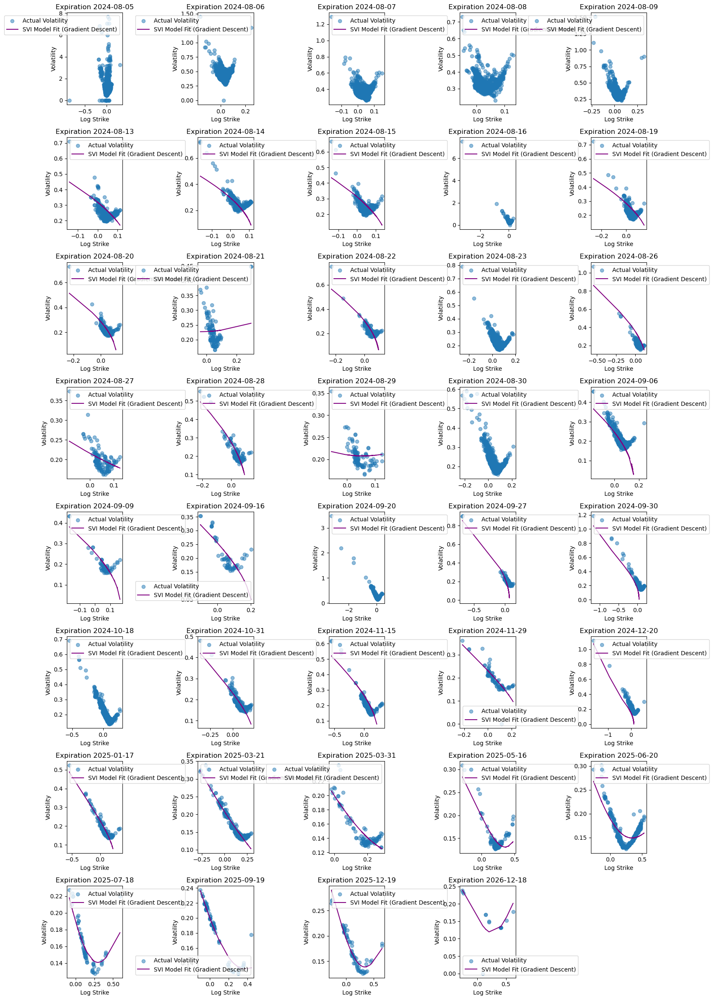

In [34]:
# Gradient Descent 최적화를 위한 설정
learning_rate = 0.001  # 학습률
iterations = 20000  # 반복 횟수
tolerance = 1e-6  # 수렴 조건
epsilon = 1e-8  # 수치 안정성을 위한 작은 값

# 손실 함수의 그레이디언트를 계산하는 함수
def gradient_objective(params, k, w_actual):
    """
    손실 함수에 대한 그레이디언트 계산
    """
    a, b, rho, m, sigma = params
    grad = np.zeros_like(params)
    
    # SVI 모델에 대한 예측값 및 차이 계산
    w_pred = svi_model(k, a, b, rho, m, sigma)
    diff = w_pred - w_actual
    
    # 각 파라미터에 대한 그레이디언트 계산
    grad[0] = np.sum(2 * diff)  # a에 대한 그레이디언트
    grad[1] = np.sum(2 * diff * (rho * (k - m) + np.sqrt((k - m)**2 + sigma**2)))  # b에 대한 그레이디언트
    grad[2] = np.sum(2 * diff * b * (k - m))  # rho에 대한 그레이디언트
    grad[3] = np.sum(2 * diff * b * (-rho + (k - m) / np.sqrt((k - m)**2 + sigma**2)))  # m에 대한 그레이디언트
    grad[4] = np.sum(2 * diff * b * sigma / np.sqrt((k - m)**2 + sigma**2))  # sigma에 대한 그레이디언트
    
    return grad

# Gradient Descent 알고리즘
def gradient_descent(k, w_actual, initial_params, learning_rate, iterations, tolerance):
    params = np.array(initial_params)
    for i in range(iterations):
        grad = gradient_objective(params, k, w_actual)
        params = params - learning_rate * grad  # 그레이디언트 업데이트
        
        # 수렴 조건 확인
        if np.linalg.norm(grad) < tolerance:
            print(f"Convergence reached at iteration {i}")
            break
    return params

# Step 8: 각 만기일별로 Gradient Descent 적용
gd_svi_params = {}
for expiration in expiration_dates:
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values
    w_actual = subset['w_actual'].values
    
    # Gradient Descent 최적화 수행
    optimized_params = gradient_descent(k, w_actual, initial_params, learning_rate, iterations, tolerance)
    
    gd_svi_params[expiration] = optimized_params

# Step 9: Gradient Descent 결과 시각화
plt.figure(figsize=(15, rows * 3))

for i, expiration in enumerate(expiration_dates, 1):
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values
    w_actual = subset['w_actual'].values
    
    params = gd_svi_params[expiration]
    
    plt.subplot(rows, cols, i)
    plt.scatter(k, np.sqrt(w_actual), label='Actual Volatility', alpha=0.5)
    plt.plot(k, np.sqrt(svi_model(k, *params)), label='SVI Model Fit (Gradient Descent)', color='purple')
    plt.xlabel('Log Strike')
    plt.ylabel('Volatility')
    plt.title(f'Expiration {expiration}')
    plt.legend()

plt.tight_layout()
plt.show()


아니면 L-BFGS-B 중에서 방법 1(strict convexity)적용한 데이터에 gradient descent 적용해보자..

/Users/justhaji/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minimize.py:565: RuntimeWarning: Method L-BFGS-B cannot handle constraints.
  warn('Method %s cannot handle constraints.' % method,
/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/4196697600.py:39: RuntimeWarning: invalid value encountered in sqrt
  plt.plot(k, np.sqrt(svi_model(k, *params)), label='SVI Model Fit (Strict Convex)', color='red')


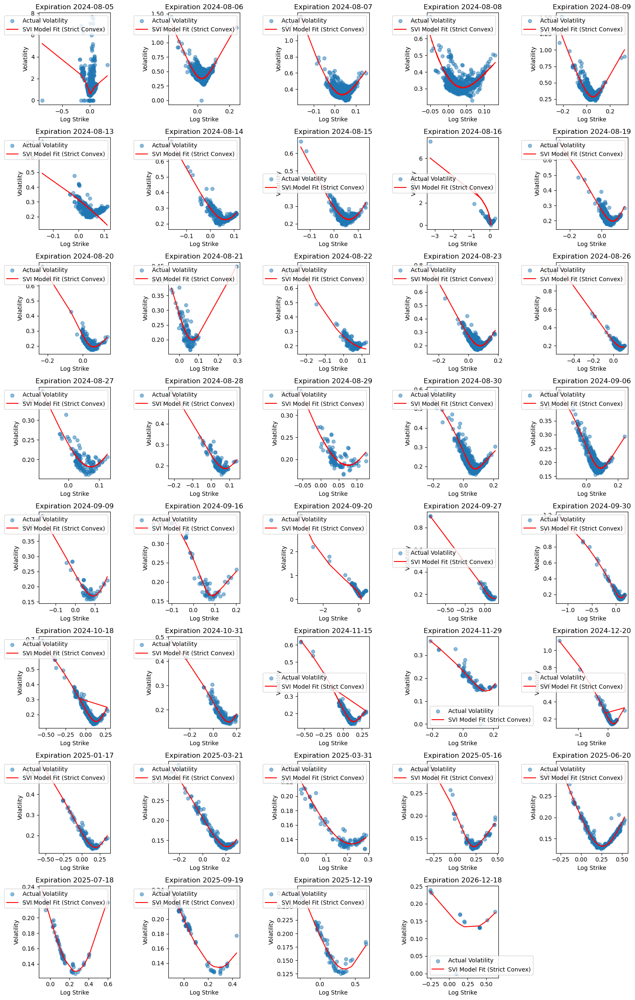

In [35]:
# strict convexity 제약 조건 함수
def strict_convexity_constraint(params, k, epsilon=1e-4):
    """
    이차 미분의 하한을 설정하여 더 엄격한 convexity 조건을 부과하는 함수
    """
    # SVI 모델의 이차 미분값 계산 (곡선의 convexity 확인)
    second_derivs = second_derivative_constraint(params, k)
    return second_derivs - epsilon  # 이차 미분이 epsilon 이상이어야 함

# Step 7: strict convexity를 적용한 최적화 수행
strict_svi_params = {}
for expiration in expiration_dates:
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values
    w_actual = subset['w_actual'].values
    
    # strict convexity를 제약으로 추가
    strict_constraints = constraints + [{'type': 'ineq', 'fun': strict_convexity_constraint, 'args': (k,)}]
    
    # 최적화 수행 (strict convexity 적용)
    result = minimize(objective_function, initial_params, args=(k, w_actual),
                      method='L-BFGS-B', bounds=bounds, constraints=strict_constraints)
    
    # 최적화된 파라미터 저장
    strict_svi_params[expiration] = result.x

# Step 8: strict convexity가 적용된 변동성 스마일 시각화
plt.figure(figsize=(15, rows * 3))

for i, expiration in enumerate(expiration_dates, 1):
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values
    w_actual = subset['w_actual'].values
    
    params = strict_svi_params[expiration]
    
    plt.subplot(rows, cols, i)
    plt.scatter(k, np.sqrt(w_actual), label='Actual Volatility', alpha=0.5)
    plt.plot(k, np.sqrt(svi_model(k, *params)), label='SVI Model Fit (Strict Convex)', color='red')
    plt.xlabel('Log Strike')
    plt.ylabel('Volatility')
    plt.title(f'Expiration {expiration}')
    plt.legend()

plt.tight_layout()
plt.show()

/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/3649356937.py:5: RuntimeWarning: overflow encountered in multiply
  return a + b * (rho * (k - m) + np.sqrt((k - m)**2 + sigma**2))
/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/3649356937.py:5: RuntimeWarning: overflow encountered in square
  return a + b * (rho * (k - m) + np.sqrt((k - m)**2 + sigma**2))
/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/3649356937.py:5: RuntimeWarning: overflow encountered in double_scalars
  return a + b * (rho * (k - m) + np.sqrt((k - m)**2 + sigma**2))
/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/3649356937.py:5: RuntimeWarning: invalid value encountered in add
  return a + b * (rho * (k - m) + np.sqrt((k - m)**2 + sigma**2))
/var/folders/br/wv_clq_j04qb0j90qb96j_c00000gn/T/ipykernel_9235/1163537108.py:21: RuntimeWarning: overflow encountered in multiply
  grad[1] = np.sum(2 * diff * (rho * (k - m) + np.sqrt((k - m)**2 + sigma**2)))  

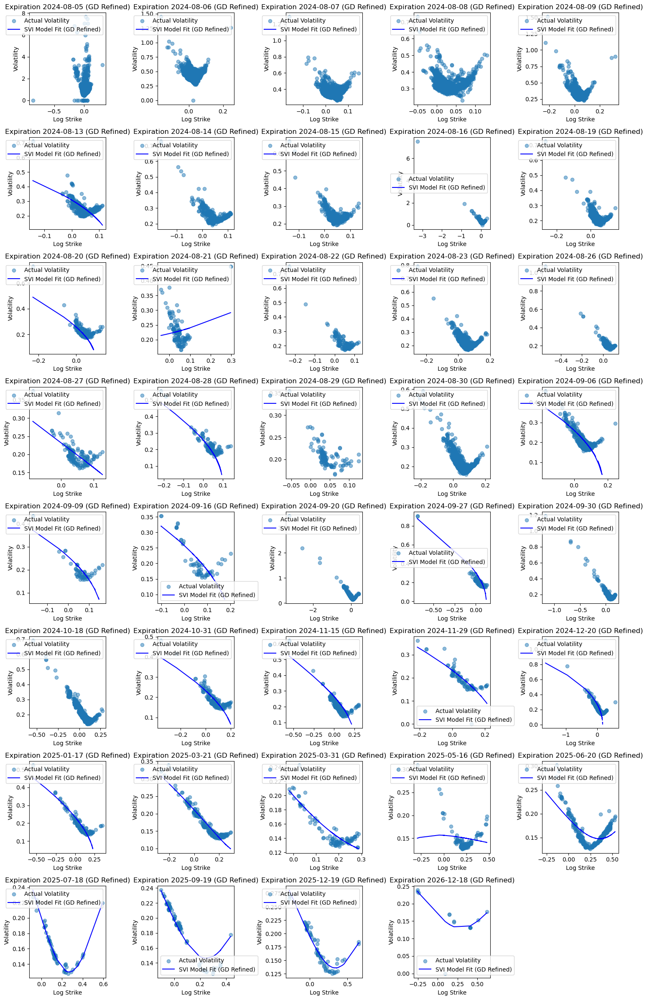

In [36]:
# Step 9: Gradient Descent를 사용하여 strict convexity 최적화된 결과에 추가 최적화 수행
learning_rate = 0.001  # 학습률
iterations = 20000  # 반복 횟수

# Gradient Descent로 추가 최적화된 파라미터를 저장할 딕셔너리
gd_refined_svi_params = {}

# 각 만기일별로 Gradient Descent를 적용
for expiration in expiration_dates:
    # 해당 만기일 데이터 추출
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values
    w_actual = subset['w_actual'].values
    
    # L-BFGS-B로 최적화된 파라미터를 초기값으로 사용
    params = strict_svi_params[expiration]
    
    # Gradient Descent 반복 수행
    for _ in range(iterations):
        grad = gradient_objective(params, k, w_actual)  # 그레이디언트 계산
        params = params - learning_rate * grad  # 그레이디언트 디센트 업데이트
    
    # 최종 파라미터 저장
    gd_refined_svi_params[expiration] = params

# Step 10: Gradient Descent가 적용된 strict convexity 변동성 스마일 시각화
plt.figure(figsize=(15, rows * 3))

for i, expiration in enumerate(expiration_dates, 1):
    subset = data_call[data_call['expiration'] == expiration]
    k = subset['log_strike'].values
    w_actual = subset['w_actual'].values
    
    params = gd_refined_svi_params[expiration]
    
    plt.subplot(rows, cols, i)
    plt.scatter(k, np.sqrt(w_actual), label='Actual Volatility', alpha=0.5)
    plt.plot(k, np.sqrt(svi_model(k, *params)), label='SVI Model Fit (GD Refined)', color='blue')
    plt.xlabel('Log Strike')
    plt.ylabel('Volatility')
    plt.title(f'Expiration {expiration} (GD Refined)')
    plt.legend()

plt.tight_layout()
plt.show()
